# California Season Prediction

## Imports and Functions

In [1]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.gaussian_process.kernels import RBF, WhiteKernel
from sklearn.gaussian_process import GaussianProcessRegressor


from sklearn.svm import SVR
import os
import matplotlib.pyplot as plt
import numpy as np
from xgboost import XGBRegressor

In [2]:
# Add the folder to the Python path

os.chdir("../../")
# change working directory to project's root path
print(os.getcwd())

FIRST_YEAR= 1990

c:\Users\marti\Desktop\data\hw_extra


In [3]:
def model_predict(data, regressor, len_pred):

    data['Date'] = pd.to_datetime(data['Date'])
    data['Date'] = data['Date'].dt.to_period('M').astype(str)

    indices_of_interest = ["HWN", "HWF", "HWD", "HWM", "HWA"]
    features = data.columns.difference(["Date"]+ indices_of_interest)

    # Iterate over each index to create and evaluate models
    fig, axs = plt.subplots(5, 1, figsize=(25,15))

    mae_errors = []
    mae_errors_training = []
    r2_scores = []
    r2_scores_training = []
    for i in range(len(indices_of_interest)):
        X = data[features]
        y = data[indices_of_interest[i]]
        dates = data["Date"]
        
        # Split into training and testing sets
        X_train, X_test, y_train, y_test = X[:-len_pred], X[-len_pred:], y[:-len_pred], y[-len_pred:]
        train_dates, test_dates = dates[:-len_pred], dates[-len_pred:]
        
        regressor.fit(X_train, y_train)
        y_pred = regressor.predict(X_test)
        y_pred_train = regressor.predict(X_train)
        
        # Evaluation
        mae_errors.append(mean_absolute_error(y_test, y_pred))
        mae_errors_training.append(mean_absolute_error(y_train, y_pred_train))
        r2_scores.append(r2_score(y_test, y_pred))
        r2_scores_training.append(r2_score(y_train, y_pred_train))
        

        # Plot training values
        axs[i].plot(
            train_dates,
            y_train,
            label="Training",
            marker='o',
            color='green',
            linestyle='-',
            linewidth=1.5
        )
        axs[i].plot(
            train_dates,
            y_pred_train,
            label="Predicted Training",
            marker='x',
            color='red',
            linestyle='-',
            linewidth=1.5
        )
        axs[i].plot(
            test_dates,
            y_test,
            label="Test",
            marker='o',
            color='blue',
            linestyle='-',
            linewidth=1.5
        )
        axs[i].plot(
            test_dates,
            y_pred,
            label="Predicted Test",
            marker='x',
            color='red',
            linestyle='--',
            linewidth=1.5
        )
        axs[i].set_title(f"Prediction for {indices_of_interest[i]}")
        axs[i].legend()
    fig.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

    return [mae_errors, mae_errors_training, r2_scores, r2_scores_training]


In [4]:
data = {i: pd.read_csv(f"data/features/california/from{FIRST_YEAR}/HWs_cali_features_biseason_{i}.csv") for i in range(1,13)}

##   DJ-JF-FM

### Linear Regression

In [5]:
linear_stats = {}

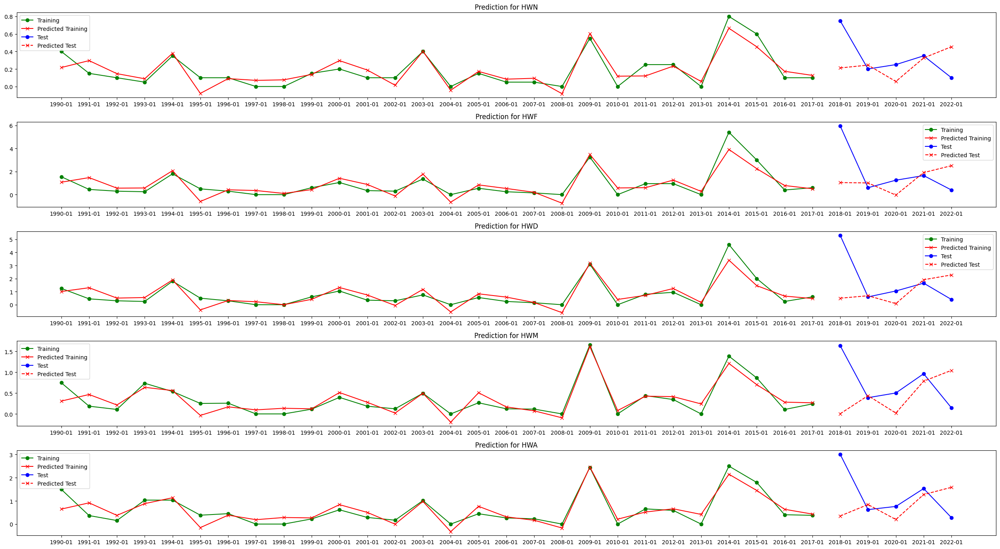

In [6]:
linear_stats[1] = model_predict(data[1], LinearRegression(), 5)

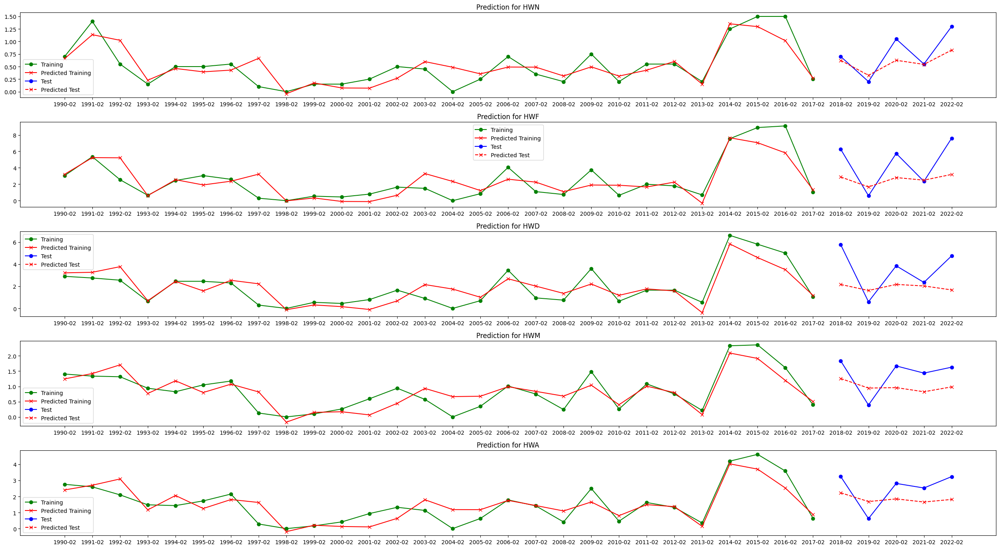

In [7]:
linear_stats[2] = model_predict(data[2], LinearRegression(), 5)

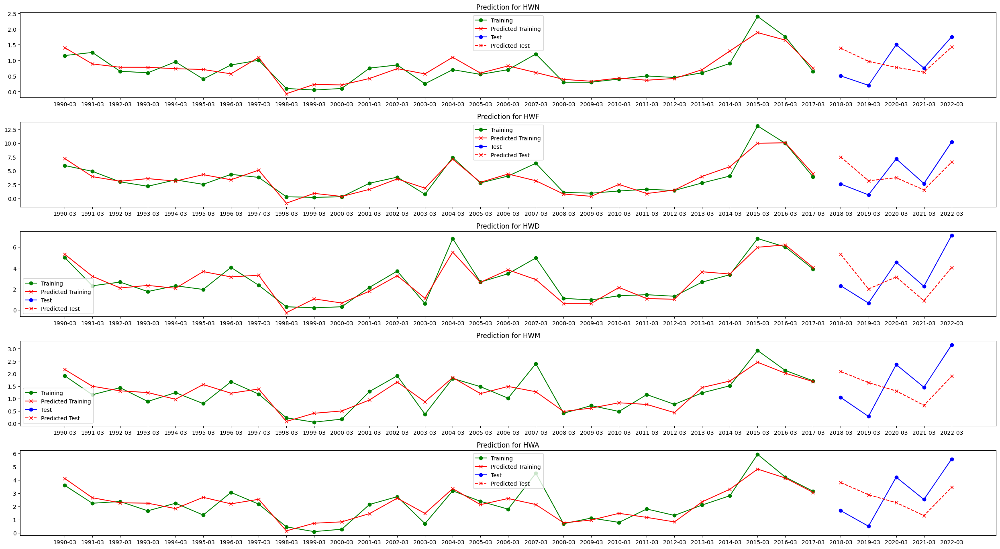

In [8]:
linear_stats[3] = model_predict(data[3], LinearRegression(), 5)

### RF

In [9]:
RF_stats = {}

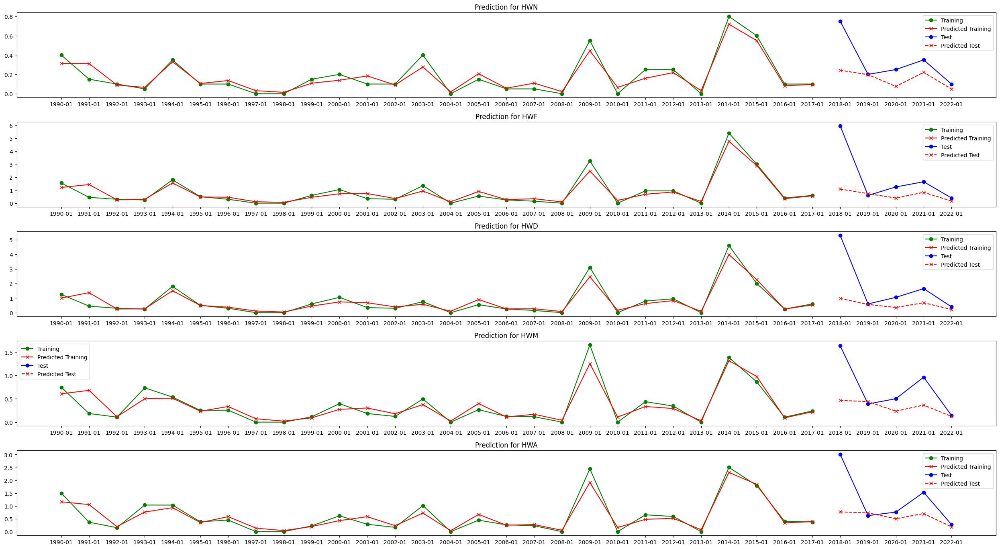

In [10]:
RF_stats[1] = model_predict(data[1], RandomForestRegressor(random_state=42, n_estimators=100), 5)

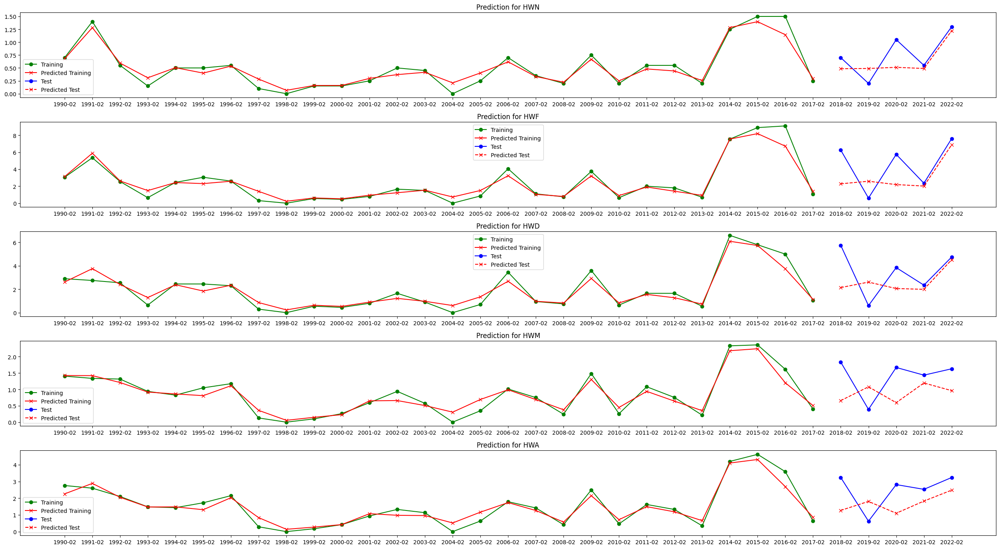

In [11]:
RF_stats[2] = model_predict(data[2], RandomForestRegressor(random_state=42, n_estimators=100), 5)

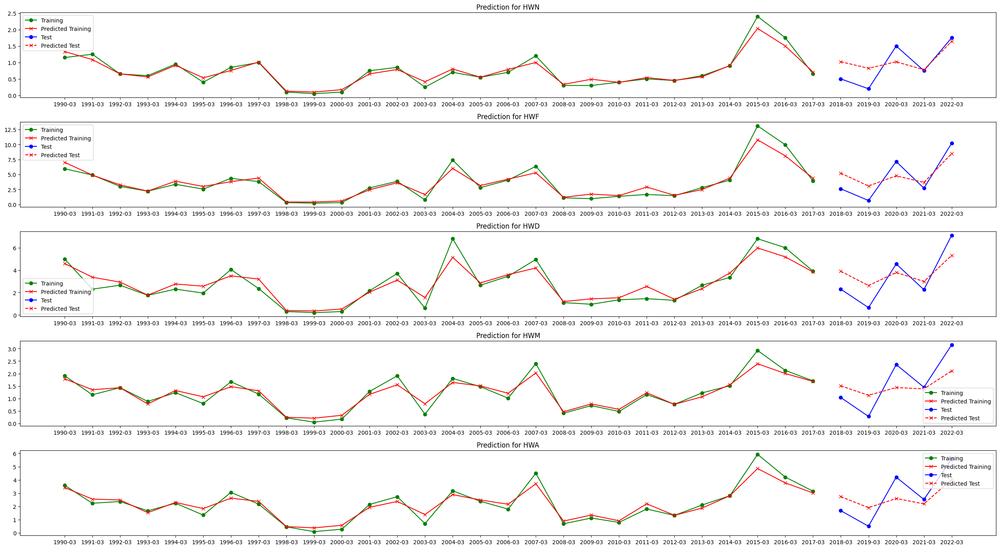

In [12]:
RF_stats[3] = model_predict(data[3], RandomForestRegressor(random_state=42, n_estimators=100), 5)

### SVC

In [13]:
svc_stats = {}

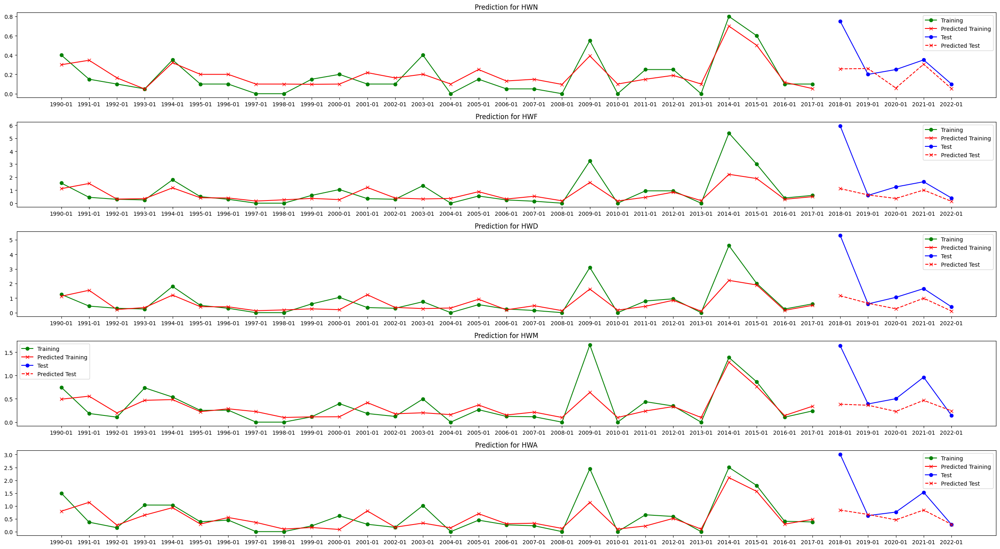

In [14]:
svc_stats[1] = model_predict(data[1], SVR(kernel='rbf') , 5)

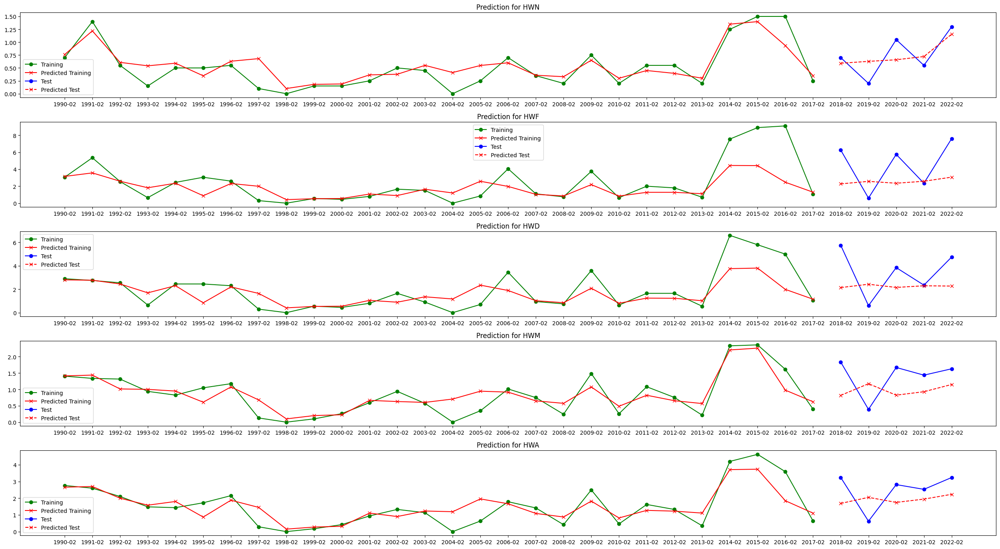

In [15]:
svc_stats[2] = model_predict(data[2], SVR(kernel='rbf') , 5)

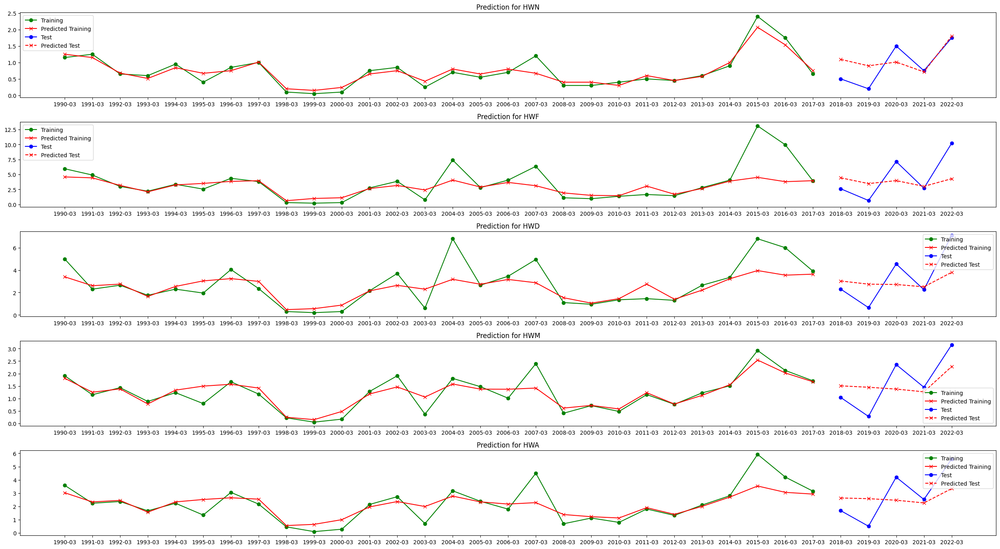

In [16]:
svc_stats[3] = model_predict(data[3], SVR(kernel='rbf') , 5)

### XGBoost

In [17]:
XGBoost_stats = {}

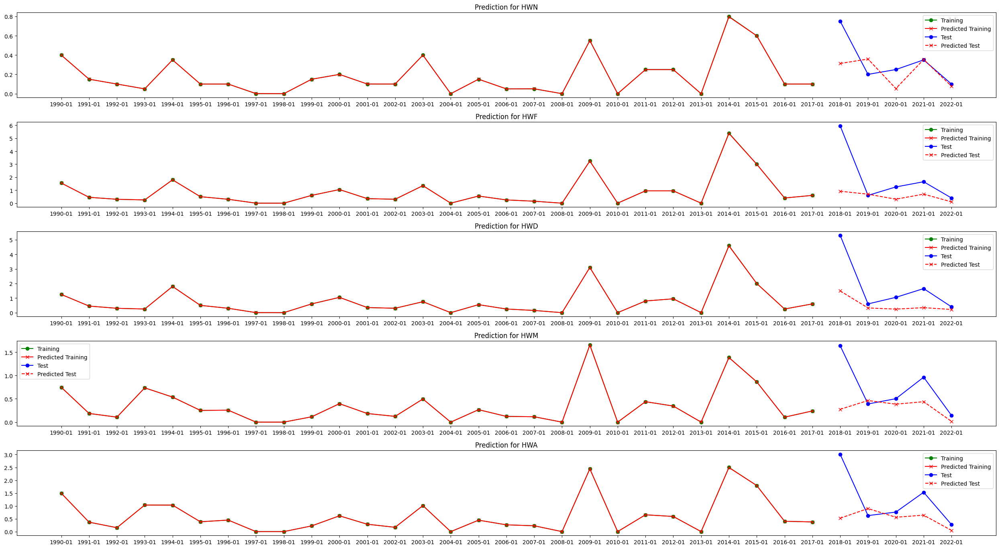

In [18]:
XGBoost_stats[1] = model_predict(data[1], XGBRegressor(random_state=42, n_estimators=100, learning_rate=0.1), 5)

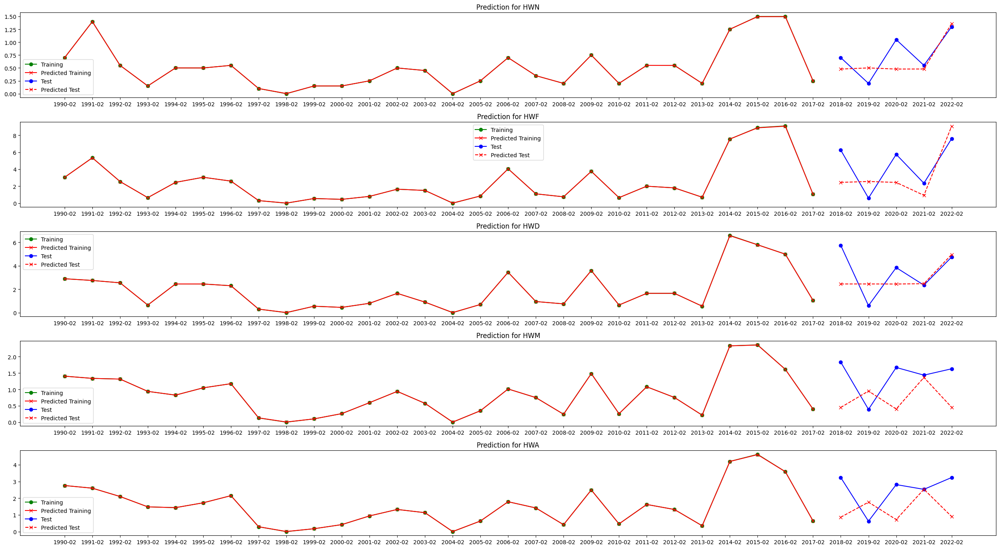

In [19]:
XGBoost_stats[2] = model_predict(data[2], XGBRegressor(random_state=42, n_estimators=100, learning_rate=0.1), 5)

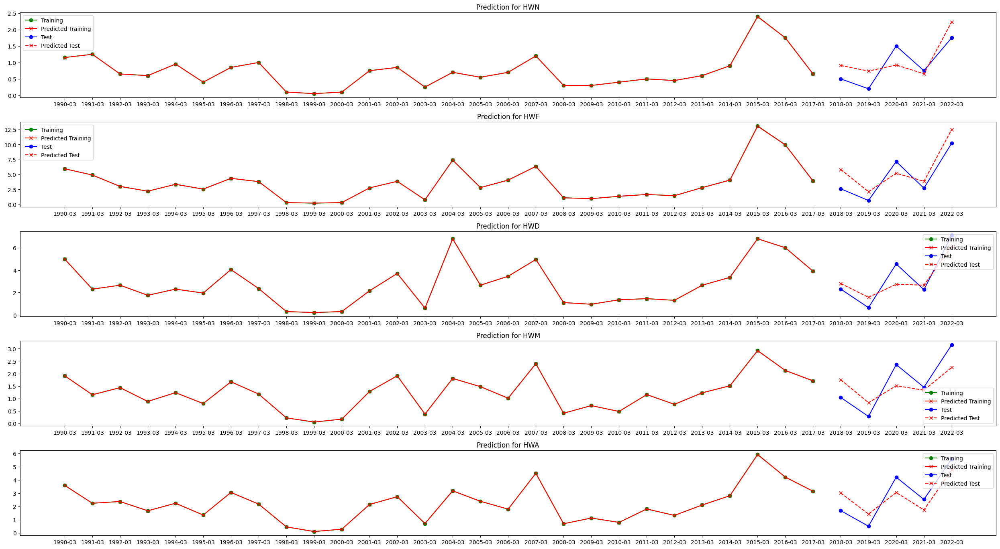

In [20]:
XGBoost_stats[3] = model_predict(data[3], XGBRegressor(random_state=42, n_estimators=100, learning_rate=0.1), 5)

### GaussianProcess Regressor

In [21]:
kernel = RBF(length_scale=1.0) + WhiteKernel(noise_level=1)
GPR_stats = {}

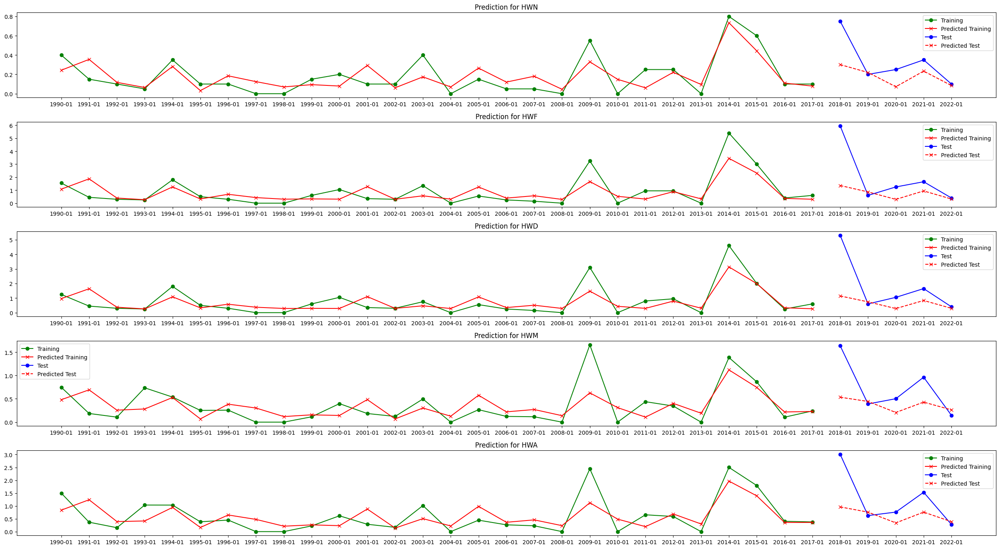

In [22]:
GPR_stats[1] = model_predict(data[1], GaussianProcessRegressor(kernel=kernel, random_state=42, n_restarts_optimizer=10), 5)

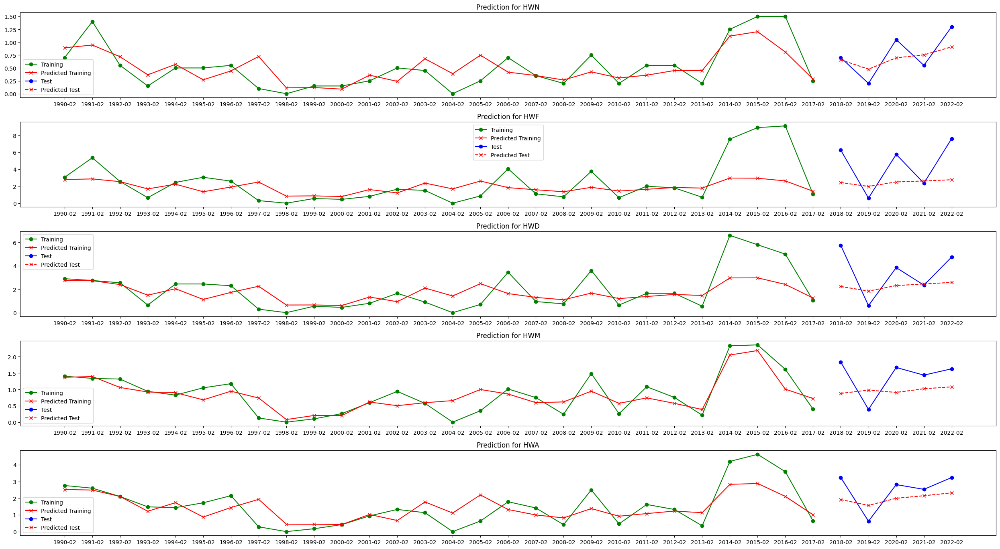

In [23]:
GPR_stats[2] = model_predict(data[2], GaussianProcessRegressor(kernel=kernel, random_state=42, n_restarts_optimizer=10), 5)

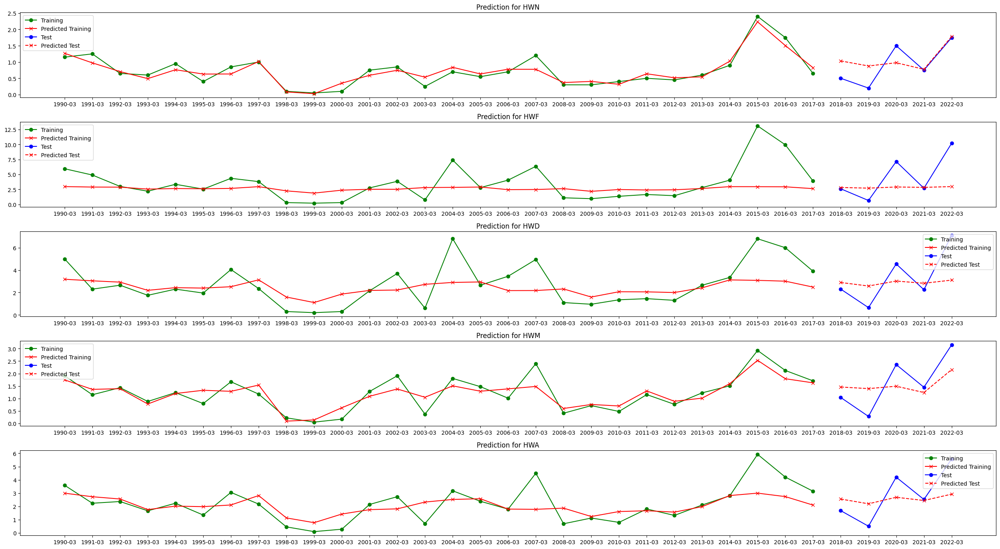

In [24]:
GPR_stats[3] = model_predict(data[3], GaussianProcessRegressor(kernel=kernel, random_state=42, n_restarts_optimizer=10), 5)

### Results

In [25]:
indices_of_interest = ["Model", "Season", "HWN", "HWF", "HWD", "HWM", "HWA"]
results_mae_df = pd.DataFrame(columns=indices_of_interest)
for i in range(1,4):
    results_mae_df.loc[len(results_mae_df.index)] = ["Linear", i] + linear_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["RF", i] + RF_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["SVC", i] + svc_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["XGBoost", i] + XGBoost_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["GPR", i] + GPR_stats[i][0]

results_mae_df.style.set_caption("MAE Model Results in Prediction").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,1,0.23,1.79,1.60,0.65,1.00
1,RF,1,0.17,1.38,1.24,0.42,0.70
2,SVC,1,0.17,1.33,1.18,0.43,0.64
3,XGBoost,1,0.16,1.46,1.28,0.44,0.82
4,GPR,1,0.16,1.32,1.20,0.42,0.70
5,Linear,2,0.22,2.39,1.94,0.62,1.06
6,RF,2,0.24,2.11,1.60,0.77,1.26
7,SVC,2,0.25,2.82,1.93,0.73,1.13
8,XGBoost,2,0.24,2.39,1.38,0.89,1.59
9,GPR,2,0.25,2.71,1.71,0.65,0.88


In [26]:
indices_of_interest = ["Model", "Season", "HWN", "HWF", "HWD", "HWM", "HWA"]
results_mae_df_training = pd.DataFrame(columns=indices_of_interest)
for i in range(1,4):
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["Linear", i] + linear_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["RF", i] + RF_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["SVC", i] + svc_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["XGBoost", i] + XGBoost_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["GPR", i] + GPR_stats[i][1]

results_mae_df_training.style.set_caption("MAE Model Results in Training").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,1,0.07,0.44,0.34,0.12,0.23
1,RF,1,0.05,0.23,0.20,0.10,0.15
2,SVC,1,0.09,0.51,0.40,0.16,0.29
3,XGBoost,1,0.00,0.00,0.00,0.00,0.00
4,GPR,1,0.10,0.52,0.43,0.22,0.36
5,Linear,2,0.17,1.00,0.72,0.27,0.49
6,RF,2,0.08,0.41,0.35,0.13,0.25
7,SVC,2,0.16,1.15,0.78,0.24,0.48
8,XGBoost,2,0.00,0.01,0.00,0.00,0.00
9,GPR,2,0.22,1.45,0.98,0.26,0.65


In [27]:
results_r2_df = pd.DataFrame(columns=indices_of_interest)
for i in range(1,4):
    results_r2_df.loc[len(results_r2_df.index)] = ["Linear", i] + linear_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["RF", i] + RF_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["SVC", i] + svc_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["XGBoost", i] + XGBoost_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["GPR", i] + GPR_stats[i][2]
results_r2_df.style.set_caption("R^2 Model Results").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,1,-0.80,-0.46,-0.70,-1.70,-0.94
1,RF,1,-0.21,-0.21,-0.24,-0.30,-0.22
2,SVC,1,-0.14,-0.18,-0.13,-0.37,-0.11
3,XGBoost,1,-0.01,-0.31,-0.05,-0.56,-0.50
4,GPR,1,0.02,-0.08,-0.14,-0.16,-0.05
5,Linear,2,0.42,-0.19,-0.60,-0.45,-0.24
6,RF,2,0.42,0.03,-0.24,-1.63,-0.97
7,SVC,2,0.46,-0.52,-0.54,-1.13,-0.47
8,XGBoost,2,0.36,0.02,0.01,-2.92,-2.56
9,GPR,2,0.46,-0.48,-0.27,-0.74,0.09


In [28]:
results_r2_df_training = pd.DataFrame(columns=indices_of_interest)
for i in range(1,4):
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["Linear", i] + linear_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["RF", i] + RF_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["SVC", i] + svc_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["XGBoost", i] + XGBoost_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["GPR", i] + GPR_stats[i][3]
results_r2_df_training.style.set_caption("R^2 Model Results Training").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,1,0.80,0.79,0.81,0.84,0.81
1,RF,1,0.91,0.93,0.92,0.87,0.90
2,SVC,1,0.74,0.52,0.59,0.62,0.64
3,XGBoost,1,1.00,1.00,1.00,1.00,1.00
4,GPR,1,0.65,0.66,0.66,0.46,0.54
5,Linear,2,0.71,0.70,0.72,0.73,0.74
6,RF,2,0.93,0.93,0.92,0.93,0.93
7,SVC,2,0.74,0.43,0.54,0.76,0.71
8,XGBoost,2,1.00,1.00,1.00,1.00,1.00
9,GPR,2,0.56,0.23,0.37,0.73,0.53


##  JJ-JA-AS

### Linear Regression

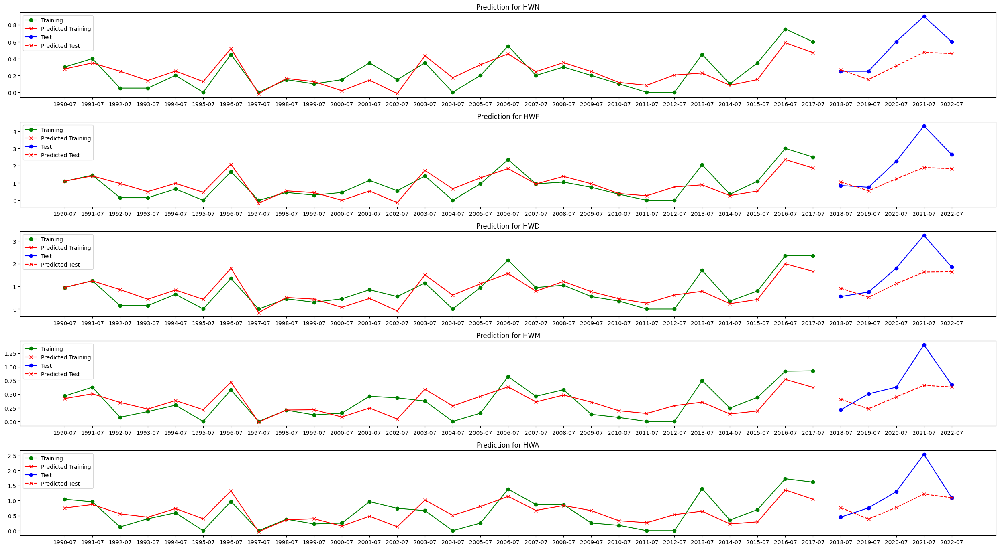

In [29]:
linear_stats[7] = model_predict(data[7], LinearRegression(), 5)

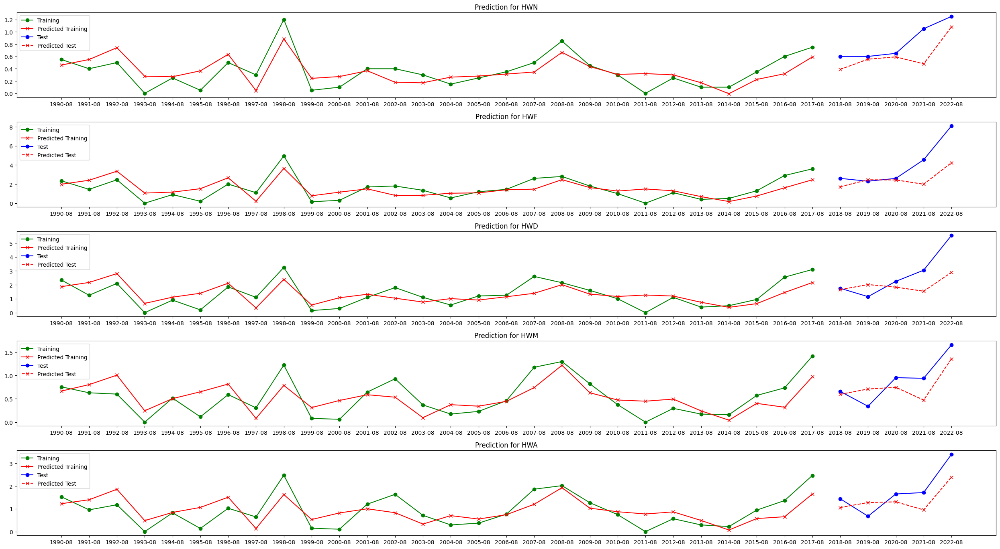

In [30]:
linear_stats[8] = model_predict(data[8], LinearRegression(), 5)

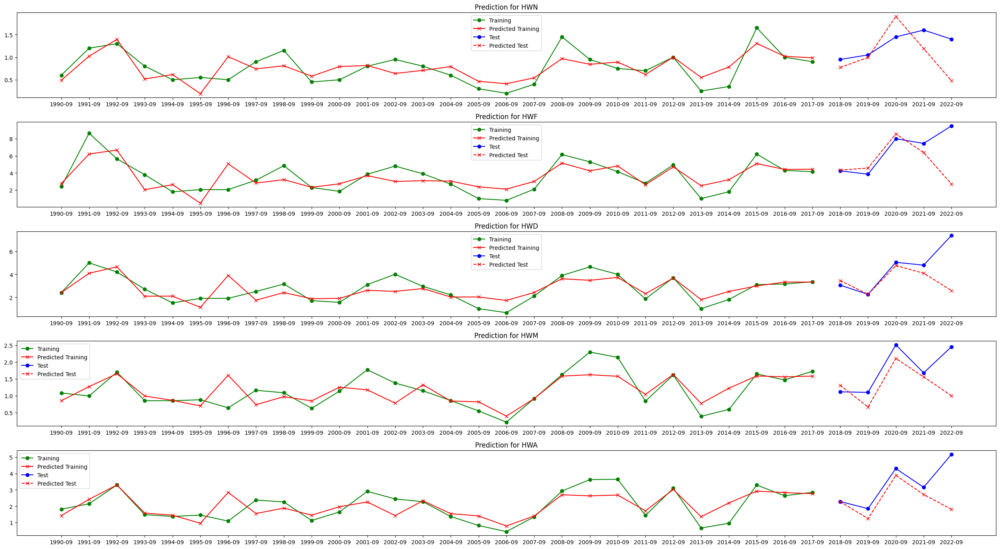

In [31]:
linear_stats[9] = model_predict(data[9], LinearRegression(), 5)

### RF

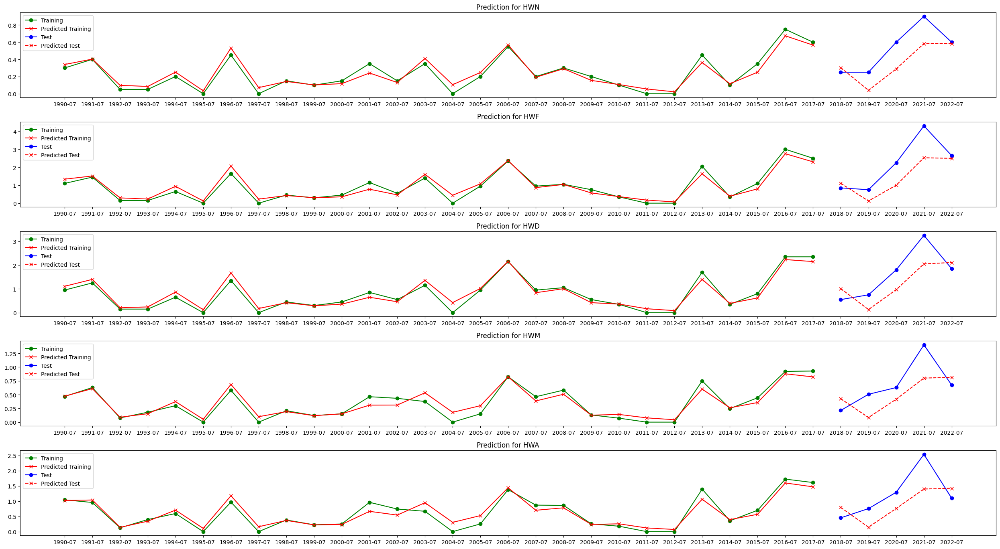

In [32]:
RF_stats[7] = model_predict(data[7], RandomForestRegressor(random_state=42, n_estimators=100), 5)

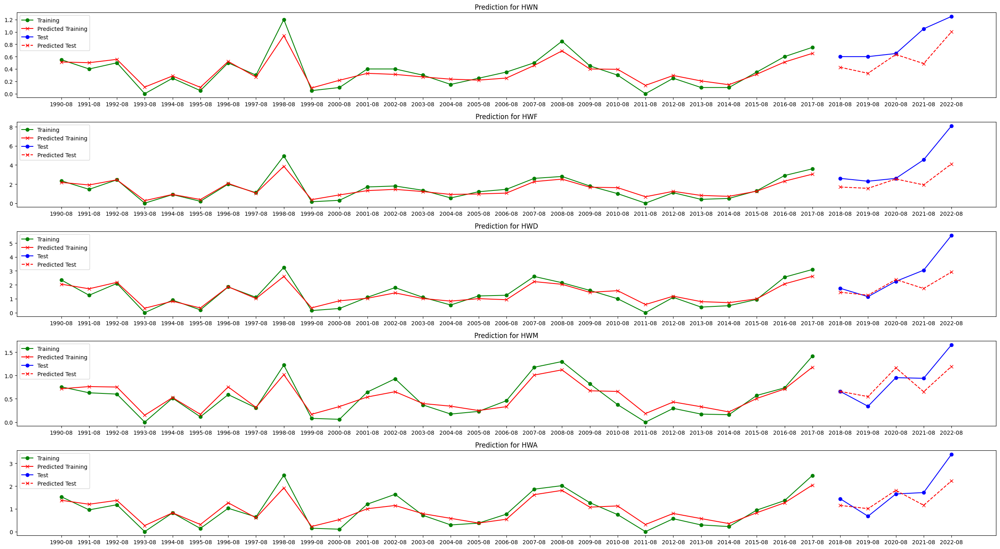

In [33]:
RF_stats[8] = model_predict(data[8], RandomForestRegressor(random_state=42, n_estimators=100), 5)

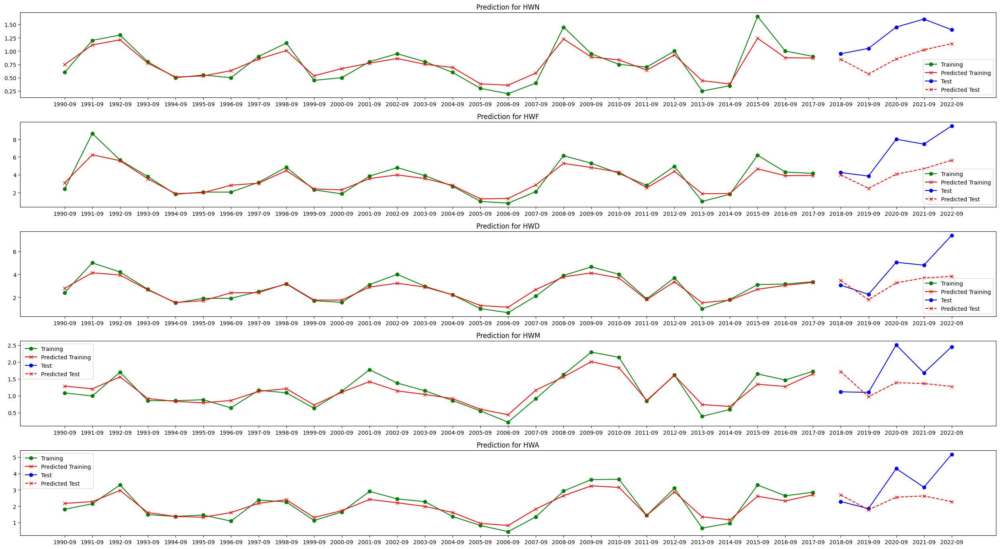

In [34]:
RF_stats[9] = model_predict(data[9], RandomForestRegressor(random_state=42, n_estimators=100), 5)

### SVC

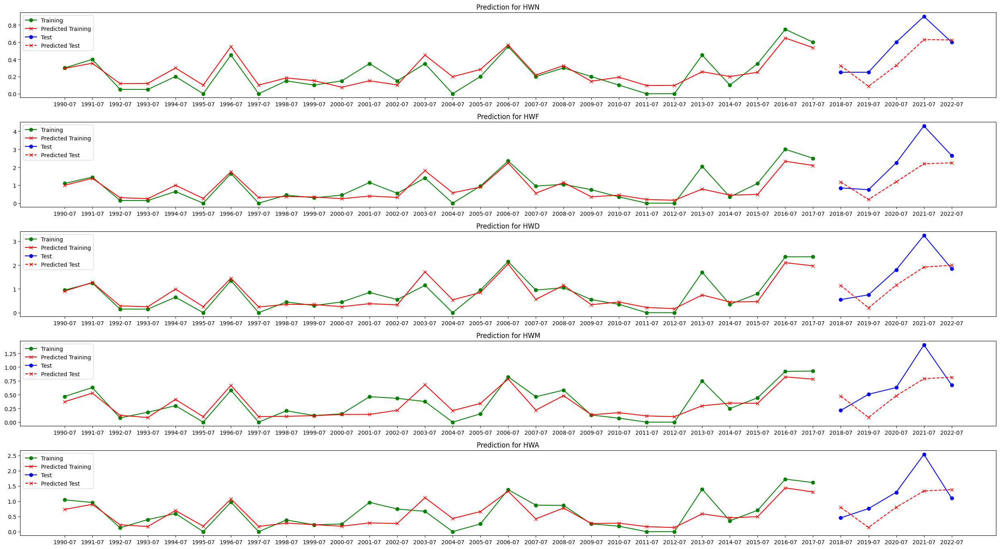

In [35]:
svc_stats[7] = model_predict(data[7], SVR(kernel='rbf') , 5)

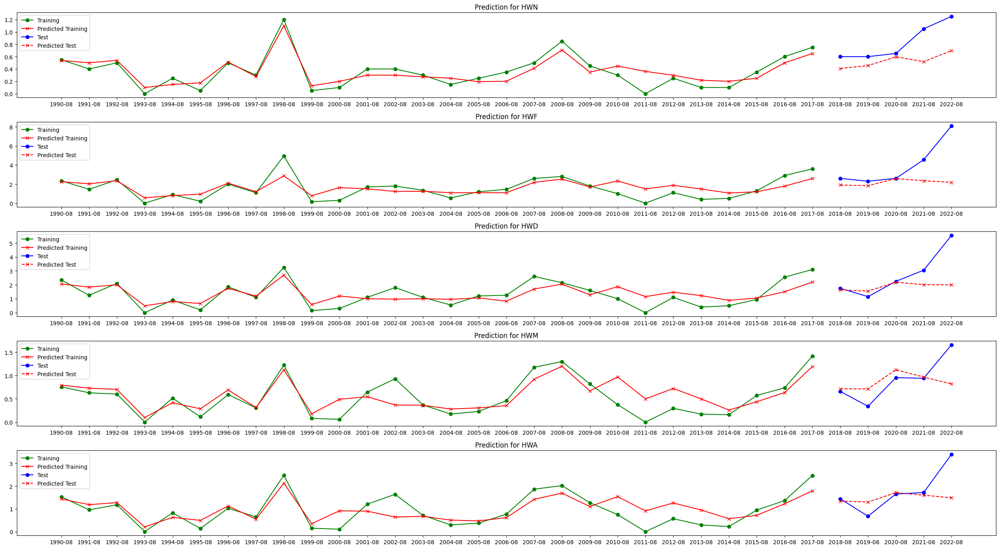

In [36]:
svc_stats[8] = model_predict(data[8], SVR(kernel='rbf') , 5)

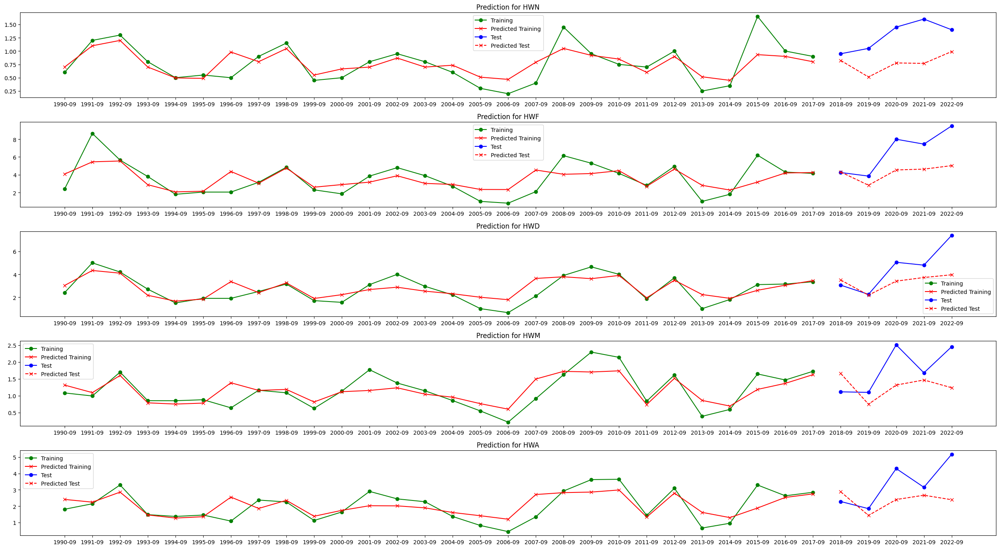

In [37]:
svc_stats[9] = model_predict(data[9], SVR(kernel='rbf') , 5)

### XGBoost

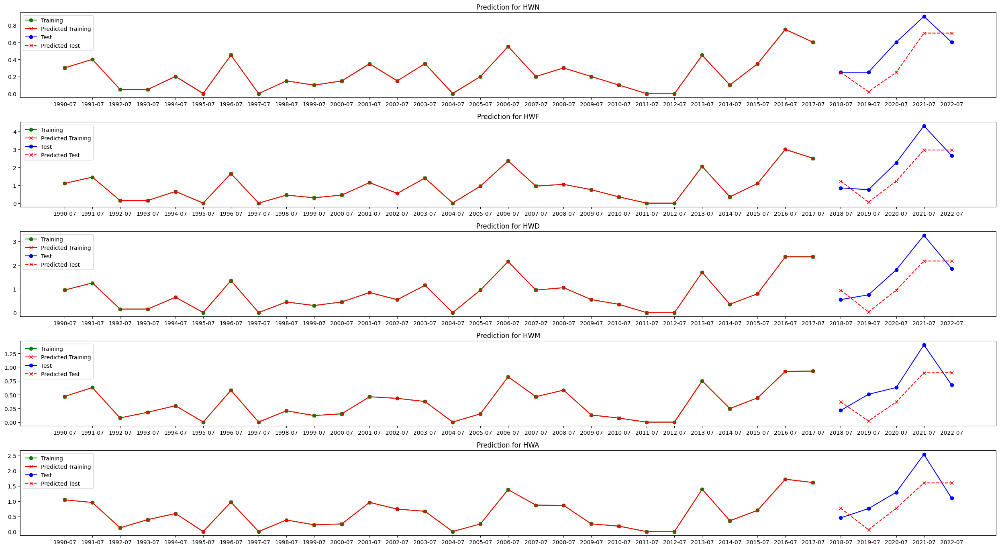

In [38]:
XGBoost_stats[7] = model_predict(data[7], XGBRegressor(random_state=42, n_estimators=100, learning_rate=0.1), 5)

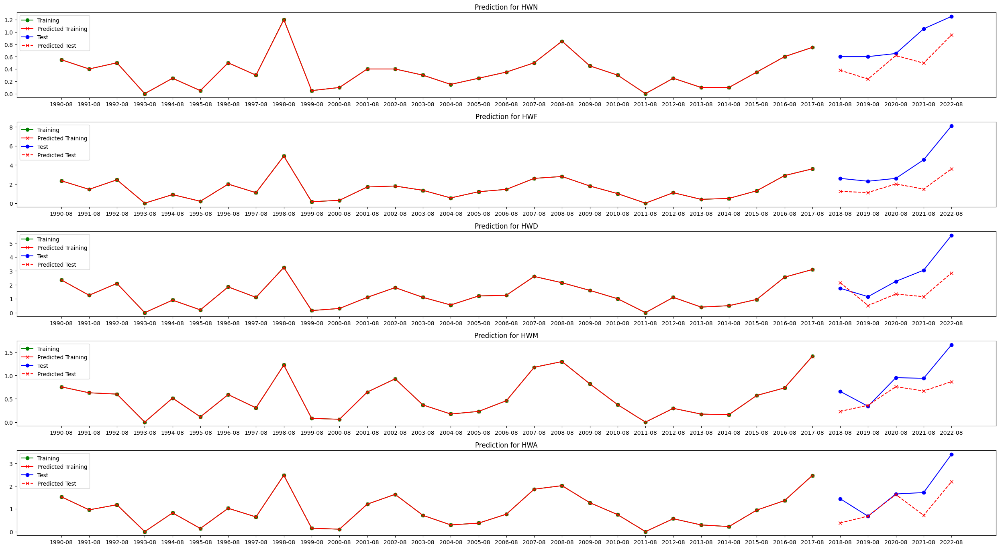

In [39]:
XGBoost_stats[8] = model_predict(data[8], XGBRegressor(random_state=42, n_estimators=100, learning_rate=0.1), 5)

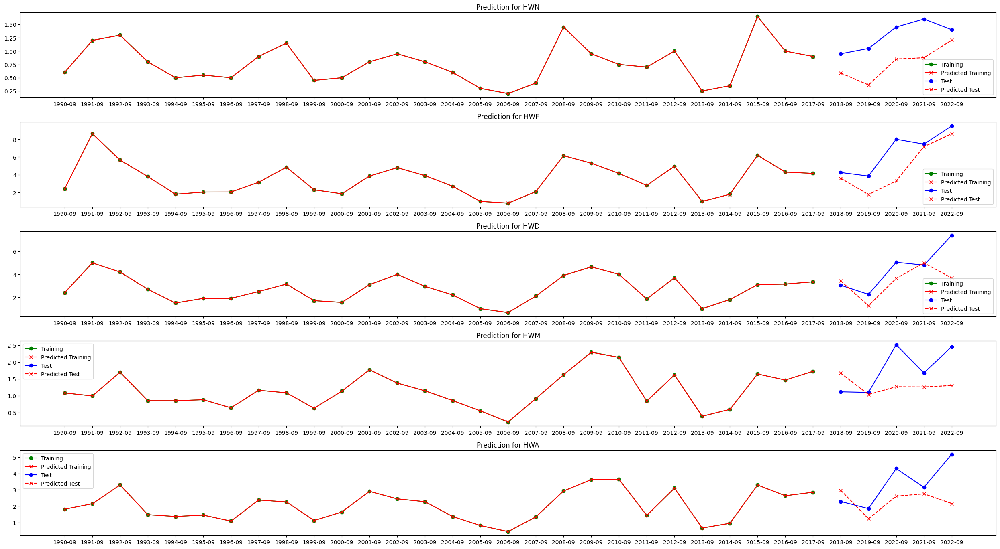

In [40]:
XGBoost_stats[9] = model_predict(data[9], XGBRegressor(random_state=42, n_estimators=100, learning_rate=0.1), 5)

### GPR

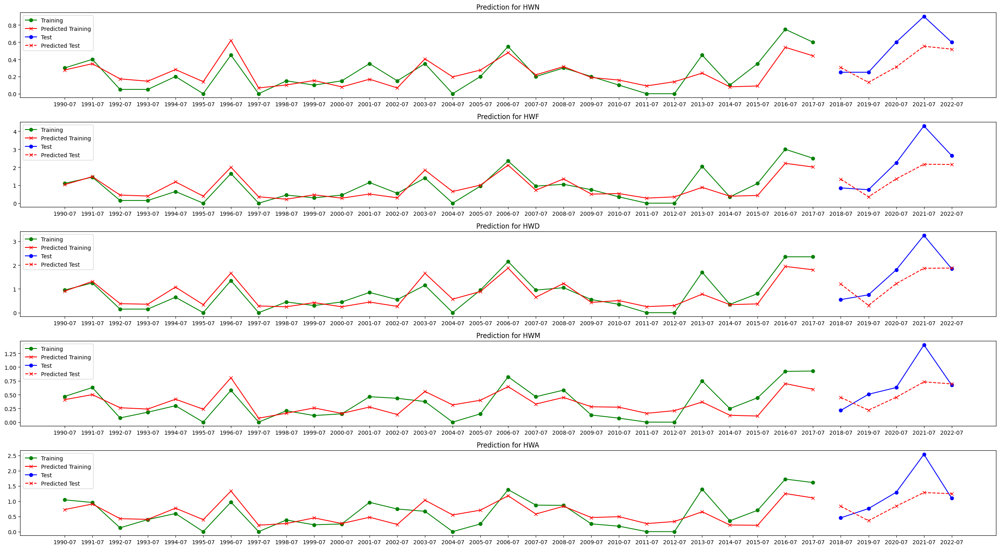

In [41]:
GPR_stats[7] = model_predict(data[7], GaussianProcessRegressor(kernel=kernel, random_state=42, n_restarts_optimizer=10), 5)

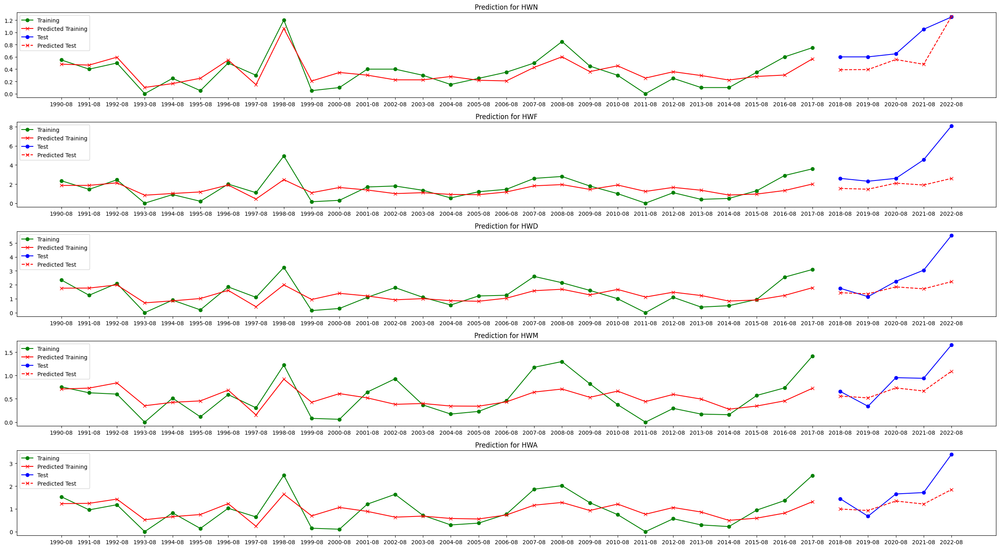

In [42]:
GPR_stats[8] = model_predict(data[8], GaussianProcessRegressor(kernel=kernel, random_state=42, n_restarts_optimizer=10), 5)

c:\Users\marti\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\gaussian_process\kernels.py:429: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


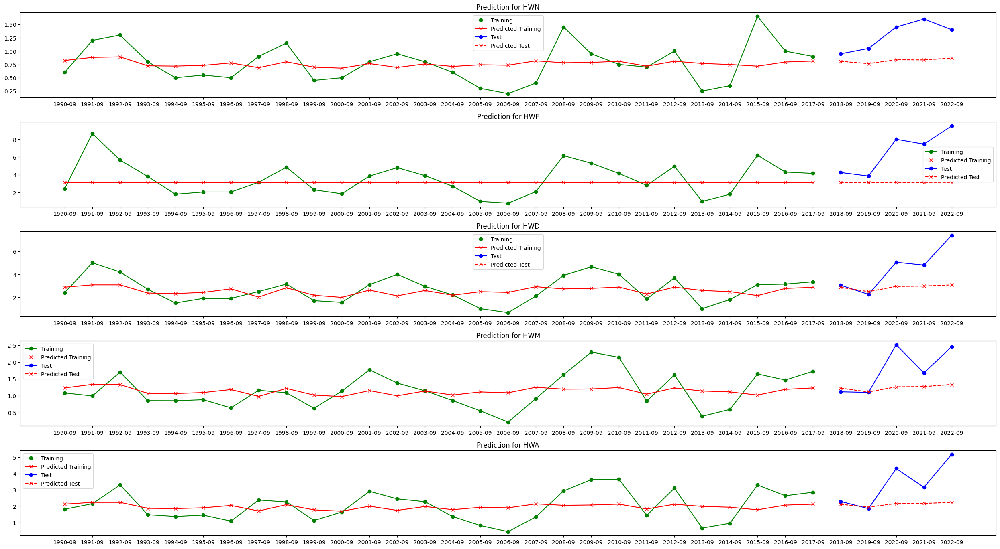

In [43]:
GPR_stats[9] = model_predict(data[9], GaussianProcessRegressor(kernel=kernel, random_state=42, n_restarts_optimizer=10), 5)

### Results

In [44]:
indices_of_interest = ["Model", "Season", "HWN", "HWF", "HWD", "HWM", "HWA"]
results_mae_df = pd.DataFrame(columns=indices_of_interest)
for i in range(7,10):
    results_mae_df.loc[len(results_mae_df.index)] = ["Linear", i] + linear_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["RF", i] + RF_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["SVC", i] + svc_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["XGBoost", i] + XGBoost_stats[i][0]
    results_mae_df.loc[len(results_mae_df.index)] = ["GPR", i] + GPR_stats[i][0]

results_mae_df.style.set_caption("MAE Model Results in Prediction").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,7,0.19,0.93,0.62,0.29,0.50
1,RF,7,0.18,0.81,0.67,0.32,0.59
2,SVC,7,0.16,0.89,0.65,0.32,0.59
3,XGBoost,7,0.18,0.75,0.67,0.33,0.59
4,GPR,7,0.18,0.88,0.62,0.28,0.53
5,Linear,8,0.21,1.52,1.11,0.28,0.62
6,RF,8,0.25,1.67,0.89,0.23,0.50
7,SVC,8,0.29,1.86,1.03,0.29,0.56
8,XGBoost,8,0.29,2.14,1.31,0.34,0.66
9,GPR,8,0.22,2.11,1.12,0.27,0.61


In [45]:
indices_of_interest = ["Model", "Season", "HWN", "HWF", "HWD", "HWM", "HWA"]
results_mae_df_training = pd.DataFrame(columns=indices_of_interest)
for i in range(7,10):
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["Linear", i] + linear_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["RF", i] + RF_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["SVC", i] + svc_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["XGBoost", i] + XGBoost_stats[i][1]
    results_mae_df_training.loc[len(results_mae_df_training.index)] = ["GPR", i] + GPR_stats[i][1]

results_mae_df_training.style.set_caption("MAE Model Results in Training").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,7,0.10,0.40,0.34,0.18,0.31
1,RF,7,0.04,0.17,0.14,0.07,0.13
2,SVC,7,0.08,0.30,0.24,0.13,0.23
3,XGBoost,7,0.00,0.00,0.00,0.00,0.00
4,GPR,7,0.10,0.35,0.29,0.18,0.30
5,Linear,8,0.15,0.67,0.55,0.24,0.44
6,RF,8,0.08,0.32,0.27,0.13,0.22
7,SVC,8,0.10,0.59,0.47,0.19,0.35
8,XGBoost,8,0.00,0.00,0.00,0.00,0.00
9,GPR,8,0.14,0.73,0.59,0.28,0.48


In [46]:
results_r2_df = pd.DataFrame(columns=indices_of_interest)
for i in range(7,10):
    results_r2_df.loc[len(results_r2_df.index)] = ["Linear", i] + linear_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["RF", i] + RF_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["SVC", i] + svc_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["XGBoost", i] + XGBoost_stats[i][2]
    results_r2_df.loc[len(results_r2_df.index)] = ["GPR", i] + GPR_stats[i][2]
results_r2_df.style.set_caption("R^2 Model Results").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,7,0.04,0.11,0.28,0.10,0.12
1,RF,7,0.19,0.39,0.40,0.16,0.15
2,SVC,7,0.41,0.28,0.38,0.14,0.11
3,XGBoost,7,0.26,0.58,0.42,0.18,0.22
4,GPR,7,0.25,0.30,0.38,0.20,0.18
5,Linear,8,-0.11,0.07,0.12,0.48,0.44
6,RF,8,-0.33,-0.01,0.25,0.59,0.52
7,SVC,8,-0.79,-0.69,-0.18,0.08,-0.03
8,XGBoost,8,-0.60,-0.39,-0.05,0.03,0.10
9,GPR,8,-0.16,-0.65,-0.12,0.49,0.24


In [47]:
results_r2_df_training = pd.DataFrame(columns=indices_of_interest)
for i in range(7,10):
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["Linear", i] + linear_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["RF", i] + RF_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["SVC", i] + svc_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["XGBoost", i] + XGBoost_stats[i][3]
    results_r2_df_training.loc[len(results_r2_df_training.index)] = ["GPR", i] + GPR_stats[i][3]
results_r2_df_training.style.set_caption("R^2 Model Results in Training").format(precision=2)

,Model,Season,HWN,HWF,HWD,HWM,HWA
0,Linear,7,0.62,0.64,0.64,0.49,0.47
1,RF,7,0.93,0.93,0.94,0.91,0.90
2,SVC,7,0.76,0.75,0.79,0.67,0.63
3,XGBoost,7,1.00,1.00,1.00,1.00,1.00
4,GPR,7,0.63,0.72,0.74,0.50,0.51
5,Linear,8,0.55,0.52,0.47,0.49,0.47
6,RF,8,0.88,0.88,0.86,0.85,0.86
7,SVC,8,0.81,0.53,0.60,0.61,0.59
8,XGBoost,8,1.00,1.00,1.00,1.00,1.00
9,GPR,8,0.68,0.38,0.38,0.32,0.37
